##### Loading dataset from Palmetto scratch1


In [1]:
data_path = '/scratch1/yuzhey/8040/'
import os
businesses_path = os.path.join(data_path, 'business.json')

#### Showing data structure of the business.json file

In [2]:
with open(businesses_path, encoding = 'utf_8') as f:
    first_business = f.readline()
print(first_business)

{"business_id":"1SWheh84yJXfytovILXOAQ","name":"Arizona Biltmore Golf Club","address":"2818 E Camino Acequia Drive","city":"Phoenix","state":"AZ","postal_code":"85016","latitude":33.5221425,"longitude":-112.0184807,"stars":3.0,"review_count":5,"is_open":0,"attributes":{"GoodForKids":"False"},"categories":"Golf, Active Life","hours":null}



  #### Preprocessing data to create dataframe for our purpose of analyzing catering business

In [3]:
restaurant_ids = set()
rows_list =[]

import pandas as pd
import json
with open(businesses_path, encoding = 'utf_8') as f:
    for business_json in f:
        business_dict = json.loads(business_json)
        if business_dict[u'categories']!= None:
            if u'Restaurants' not in business_dict[u'categories']:
                continue
            else:
                restaurant_ids.add(business_dict[u'business_id'])
                rows_list.append(business_dict)
        else:
            continue
restaurant_ids = frozenset(restaurant_ids)

business = pd.DataFrame(rows_list)
print('{:,}'.format(len(restaurant_ids)), u'restaurants in the dataset.')
print(business.head()) 

59,371 restaurants in the dataset.
                        address  \
0          30 Eglinton Avenue W   
1     10110 Johnston Rd, Ste 15   
2       2450 E Indian School Rd   
3               5981 Andrews Rd   
4  1775 E Tropicana Ave, Ste 29   

                                          attributes             business_id  \
0  {'RestaurantsReservations': 'True', 'GoodForMe...  QXAEGFB4oINsVuTFxEYKFQ   
1  {'GoodForKids': 'True', 'NoiseLevel': 'u'avera...  gnKjwL_1w79qoiV3IC_xQQ   
2  {'RestaurantsTakeOut': 'True', 'BusinessParkin...  1Dfx3zM-rW4n-31KeC8sJg   
3  {'RestaurantsPriceRange2': '2', 'BusinessAccep...  fweCYi8FmbJXHCqLnwuk8w   
4  {'OutdoorSeating': 'False', 'BusinessAcceptsCr...  PZ-LZzSlhSe9utkQYU8pFg   

                                          categories                city  \
0  Specialty Food, Restaurants, Dim Sum, Imported...         Mississauga   
1                  Sushi Bars, Restaurants, Japanese           Charlotte   
2  Restaurants, Breakfast & Brunch, Mexican, 

#### Explore catering business distribution across states (include USA and Canada). The bar plot shows the top 16 states in the dataset.

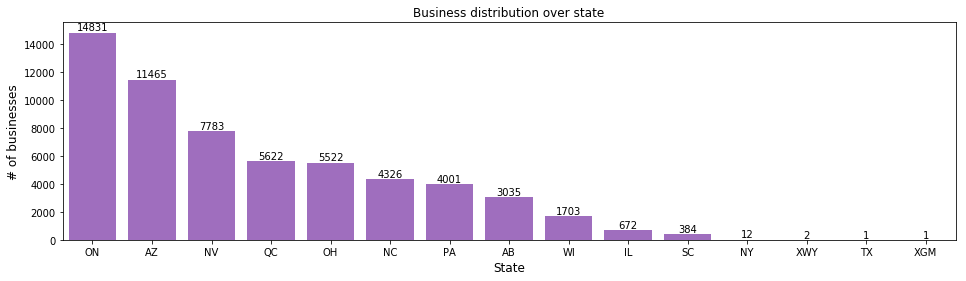

In [4]:
import matplotlib.pyplot as plt
import seaborn as sns

x = business['state'].value_counts()

x=x.iloc[0:15]

plt.figure(figsize=(16,4))
ax = sns.barplot(x.index, x.values, alpha = 0.8, color=(139/255, 57/255, 191/255))
plt.title("Business distribution over state")
plt.ylabel("# of businesses", fontsize=12)
plt.xlabel("State", fontsize=12)

rects = ax.patches
labels = x.values
for rect, label in zip(rects, labels):
    height = rect.get_height()
    ax.text(rect.get_x() + rect.get_width()/2, height + 5, label, ha='center', va = 'bottom')
plt.show()


#### Viz using GeoMap to show catering business distribution in USA at state level. The intensity positively correlate with the actual # of business in each state

In [5]:
import numpy as np
sns.set(style='whitegrid', palette='pastel', color_codes=True)
sns.mpl.rc('figure', figsize=(10,6))
%matplotlib inline
import plotly as py
import plotly.graph_objs as go
py.offline.init_notebook_mode(connected=True)

business['text'] = business['city'] + '<br>Business ' 
data = dict (
    type = 'choropleth',
    locations = business['state'].value_counts().keys().tolist(),
    locationmode='USA-states',
    colorscale='Reds',
    marker = go.choropleth.Marker(
        line = go.choropleth.marker.Line(
            color = 'rgb(255,255,255)',
            width = 2
        )),

    colorbar = go.choropleth.ColorBar(
        title = "# of Business"),
    
    z=business['state'].value_counts().tolist())

layout = go.Layout(
    title = go.layout.Title(
        text = 'US Yelp Business by State<br>(2019)'
    ),
    geo = go.layout.Geo(
        scope = 'north america',
        projection = go.layout.geo.Projection(type = 'albers usa'),
        showlakes = True,
        lakecolor = 'rgb(255, 255, 255)'),
)

map = go.Figure(data=[data], layout = layout)
py.offline.plot(map)
py.offline.iplot(map, filename='map')

#### Explore catering business distribution cross cities (include USA and Canada)
#### There are more than 700 cities in this dataset and we cannot present all of them in the bar plot. Here we show the top 20 cities.

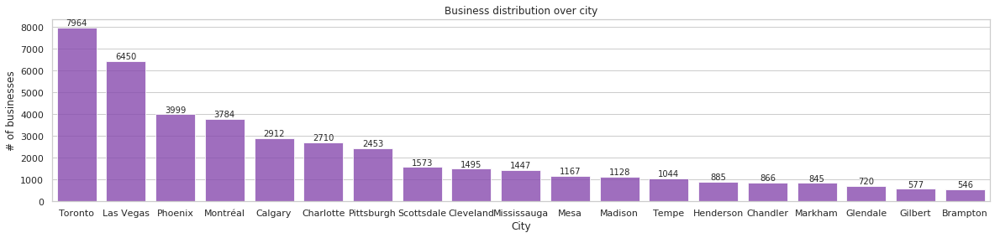

In [6]:
x = business['city'].value_counts()

x=x.iloc[0:19]

plt.figure(figsize=(20,4))
    
ax = sns.barplot(x.index, x.values, alpha = 0.8, color=(139/255, 57/255, 191/255))
plt.title("Business distribution over city")
plt.ylabel("# of businesses", fontsize=12)
plt.xlabel("City", fontsize=12)

rects = ax.patches
labels = x.values
for rect, label in zip(rects, labels):
    height = rect.get_height()
    ax.text(rect.get_x() + rect.get_width()/2, height + 5, label, ha='center', va = 'bottom')
plt.show()

#### Viz using GeoMap to show catering business distribution among USA and Canada cities. Bubble sizes correlate with the # of business, colors show the rank range of the represented city. In the GeoMap we are able to show all 782 cities data. This viz also reveals a fact that Yelp collected 10 major metropolitan area. Most of the cities are satellite cities.

In [7]:
limits = [(0,5),(5,15),(15,30),(30,50),(50,781)]
colors = ["rgb(104, 28, 89)","rgb(226, 140, 209)","rgb(226, 192, 219)","rgb(234, 215, 230)","lightgrey"]
cities = []
scale = 5

cityList = business['city'].value_counts().index.tolist()
countList = business['city'].value_counts().tolist()

longitudeList = []
latitudeList = []
textList = []
for city in cityList:
    # latitude = business[business.where(business['city'] == city).latitude.notnull()].latitude.tolist()[0]
    latitude = business[business.city == city].latitude.tolist()[0]
    latitudeList.append(latitude)
    # longitude = business[business.where(business['city'] == city).longitude.notnull()].longitude.tolist()[0]
    longitude = business[business.city == city].longitude.tolist()[0]
    longitudeList.append(longitude)
    count = business[business.city == city].city.value_counts().tolist()[0]
    text = city + '<br>Business Count: ' + str(count)
    textList.append(text)

for i in range(len(limits)):
    lim = limits[i]
    city = go.Scattergeo(
        locationmode = 'USA-states',
        lon = longitudeList[lim[0]:lim[1]],
        lat = latitudeList[lim[0]:lim[1]],
        text = textList[lim[0]:lim[1]],
        marker = go.scattergeo.Marker(
            size = [x / scale for x in countList[lim[0]:lim[1]]],
            color = colors[i],
            line = go.scattergeo.marker.Line(
                width=0.5, color='rgb(40,40,40)'
            ),
            sizemode = 'area'
        ),
        name = '{0} - {1}'.format(countList[lim[1]], countList[lim[0]]) 
    )

    cities.append(city)

layout = go.Layout(
        title = go.layout.Title(
            text = '2019 Yelp Business by City<br>(Click legend to toggle traces)'
        ),
        showlegend = True,
        geo = go.layout.Geo(
            scope = 'north america',
            projection = go.layout.geo.Projection(
                type='albers usa'
            ),
            showland = True,
            landcolor = 'rgb(217, 217, 217)',
            subunitwidth=1,
            countrywidth=1,
            subunitcolor="rgb(255, 255, 255)",
            countrycolor="rgb(255, 255, 255)"
        )
    )

fig = go.Figure(data=cities, layout=layout)
py.offline.iplot(fig, filename='d3-bubble-map')

#### We explore the star rating counts and distributions of the whole dataset. In order to later show clusters of good and bad catering business in a GeoMap presentation, we defined a color palette to assign different colors to each rating corresponding column. The warner the higher rating and the cooler the lower rating it has.

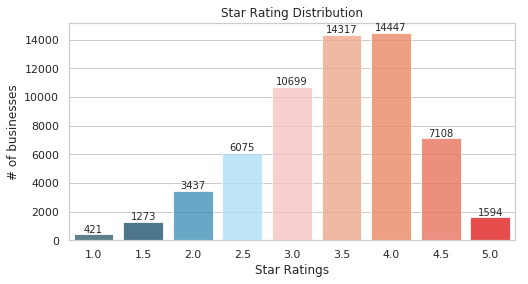

In [8]:
x = business['stars'].value_counts()
x = x.sort_index()

plt.figure(figsize=(8,4))
my_pal = {x.index[0]: (44/255, 99/255, 122/255), x.index[1]:(19/255, 89/255, 122/255),x.index[2]: (46/255, 153/255, 204/255), x.index[3]: (165/255, 226/255, 255/255), x.index[4]:(255/255, 186/255, 186/255), x.index[5]:(255/255,160/255,122/255), x.index[6]: (255/255,127/255,80/255), x.index[7]: (255/255,99/255,71/255), x.index[8]:(1,0,0)}

ax = sns.barplot(x.index, x.values, alpha = 0.8, palette = my_pal)
plt.title("Star Rating Distribution")
plt.ylabel("# of businesses", fontsize=12)
plt.xlabel("Star Ratings", fontsize=12)

rects = ax.patches
labels = x.values
for rect, label in zip(rects, labels):
    height = rect.get_height()
    ax.text(rect.get_x() + rect.get_width()/2, height + 5, label, ha='center', va = 'bottom')
plt.show()

#### The dataset includes a lot of information. We narrow down our scope to further explore 5 USA cities, which are Las Vegas, Phoenix, Charlotte, Pittsburgh, and Cleveland.

In [9]:
cityList = ['Las Vegas', 'Phoenix','Charlotte', 'Pittsburgh', 'Cleveland']
countList = []
longitudeList = []
latitudeList = []

for city in cityList:
    print(business[business.city == city].latitude.tolist()[0])
    print(business[business.city == city].longitude.tolist()[0])

for city in cityList:
    count = business[business.city == city].city.value_counts().tolist()[0]
    countList.append(count)
    latitude = business[business.city == city].latitude.tolist()[0]
    latitudeList.append(latitude)
    longitude = business[business.city == city].longitude.tolist()[0]
    longitudeList.append(longitude)

36.1000163
-115.1285285
33.4951941
-112.0285876
35.092564
-80.859132
40.4961769456
-80.2460112364
41.5408904
-81.5953266


#### In jupyter notebook, folium map can only handle up to 1200 dots. The viz shows Las Vagas catering business street distributions and also reveals the urban planning of the city. Most of the business are in the Strip area. Southwest corner and sourtheast corner of Las Vegas don't have bad rating catering businesses.

In [10]:
import folium
Las_Vegas = folium.Map(location=[36.1000163, -115.1285285], tiles = "Stamen Toner",
                    zoom_start = 11)
Las_Vegas
LV = business[business.city == 'Las Vegas']

latitudeList = LV.latitude.tolist()
longitudeList = LV.longitude.tolist()
nameList = LV.name.tolist()
starList = LV.stars.tolist()
colors = ["rgb(24, 58, 73)", "rgb(40, 85, 104)","rgb(44, 99, 122)","rgb(19, 89, 122)","rgb(46, 153, 204)","rgb(165, 226, 255)","rgb(255,186,186)","rgb(255, 160, 122)","rgb(255, 127, 80)","rgb(255, 99, 71)", "rgb(255, 0, 0)"]


for i in range(0,1200):
    folium.Circle(radius = 10, location = [latitudeList[i], longitudeList[i]], popup= nameList[i], color = colors[int(starList[i]*2)], fill = False).add_to(Las_Vegas)
Las_Vegas

#### We also draw a star rating barplot to show the rating distribution for businesses in Las Vegas. As mentioned previously, the colors of the colunms correlate with the dots show in the geo map.

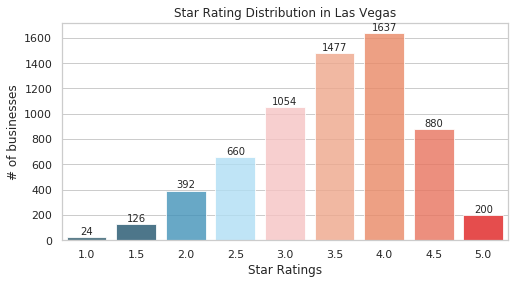

In [11]:
x = LV['stars'].value_counts()
x = x.sort_index()

plt.figure(figsize=(8,4))
my_pal = {x.index[0]: (44/255, 99/255, 122/255), x.index[1]:(19/255, 89/255, 122/255),x.index[2]: (46/255, 153/255, 204/255), x.index[3]: (165/255, 226/255, 255/255), x.index[4]:(255/255, 186/255, 186/255), x.index[5]:(255/255,160/255,122/255), x.index[6]: (255/255,127/255,80/255), x.index[7]: (255/255,99/255,71/255), x.index[8]:(1,0,0)}
ax = sns.barplot(x.index, x.values, alpha = 0.8, palette=my_pal)
plt.title("Star Rating Distribution in Las Vegas")
plt.ylabel("# of businesses", fontsize=12)
plt.xlabel("Star Ratings", fontsize=12)

rects = ax.patches
labels = x.values
for rect, label in zip(rects, labels):
    height = rect.get_height()
    ax.text(rect.get_x() + rect.get_width()/2, height + 5, label, ha='center', va = 'bottom')
plt.show()

#### We performed similar viz for the rest 4 cities.

#### Phoenix

In [12]:
Phoenix = folium.Map(location=[33.4951941, -112.0285876], tiles = "Stamen Toner",
                    zoom_start = 11)

PH = business[business.city == 'Phoenix']
for index, row in PH.iterrows():
    if index < 20000:
        folium.Circle(
            radius=10,
            location=[row['latitude'], row['longitude']],
            popup=row['name'],
            color = colors[int(row['stars']*2)],
            fill=False,
            colorOpacity = 0.5
        ).add_to(Phoenix)
        
Phoenix

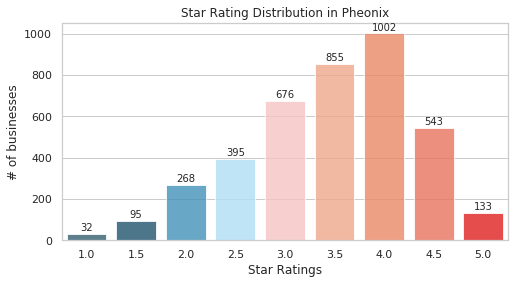

In [13]:
x = PH['stars'].value_counts()
x = x.sort_index()

plt.figure(figsize=(8,4))
ax = sns.barplot(x.index, x.values, alpha = 0.8, palette = my_pal)
plt.title("Star Rating Distribution in Pheonix")
plt.ylabel("# of businesses", fontsize=12)
plt.xlabel("Star Ratings", fontsize=12)

rects = ax.patches
labels = x.values
for rect, label in zip(rects, labels):
    height = rect.get_height()
    ax.text(rect.get_x() + rect.get_width()/2, height + 5, label, ha='center', va = 'bottom')
plt.show()

#### Charlotte

In [14]:
Charlotte = folium.Map(location=[35.092564, -80.859132], tiles = "Stamen Toner",

                    zoom_start = 11)

CH = business[business.city == 'Charlotte']
for index, row in CH.iterrows():
    if index < 30000:
        folium.Circle(
            radius=10,
            location=[row['latitude'], row['longitude']],
            popup=row['name'],
            color = colors[int(row['stars']*2)],
            fill=False,
        ).add_to(Charlotte)
        
Charlotte

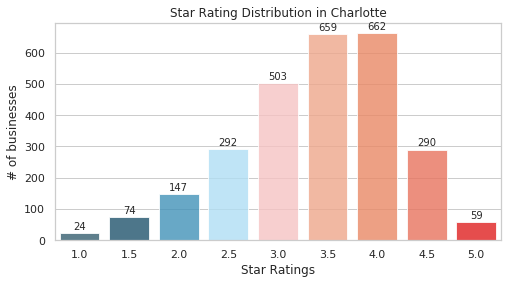

In [15]:
x = CH['stars'].value_counts()
x = x.sort_index()

plt.figure(figsize=(8,4))
ax = sns.barplot(x.index, x.values, alpha = 0.8, palette = my_pal)
plt.title("Star Rating Distribution in Charlotte")
plt.ylabel("# of businesses", fontsize=12)
plt.xlabel("Star Ratings", fontsize=12)

rects = ax.patches
labels = x.values
for rect, label in zip(rects, labels):
    height = rect.get_height()
    ax.text(rect.get_x() + rect.get_width()/2, height + 5, label, ha='center', va = 'bottom')
plt.show()

#### Pittsburgh

In [16]:
Pittsburgh = folium.Map(location=[40.4961769456, -80.2460112364],tiles = "Stamen Toner",
                    zoom_start = 11)

PI = business[business.city == 'Pittsburgh']


for index, row in PI.iterrows():
    if index < 30000:
        folium.Circle(
            radius=10,
            location=[row['latitude'], row['longitude']],
            popup=row['name'],
            color = colors[int(row['stars']*2)],
            fill=False,
        ).add_to(Pittsburgh)
        
Pittsburgh

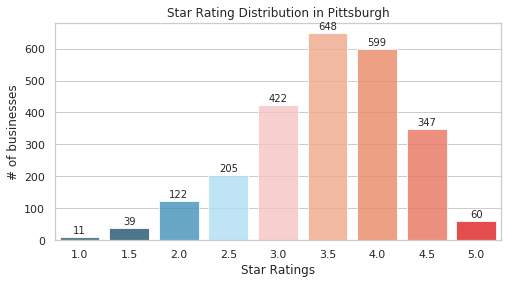

In [17]:
x = PI['stars'].value_counts()
x = x.sort_index()

plt.figure(figsize=(8,4))
ax = sns.barplot(x.index, x.values, alpha = 0.8, palette = my_pal)
plt.title("Star Rating Distribution in Pittsburgh")
plt.ylabel("# of businesses", fontsize=12)
plt.xlabel("Star Ratings", fontsize=12)

rects = ax.patches
labels = x.values
for rect, label in zip(rects, labels):
    height = rect.get_height()
    ax.text(rect.get_x() + rect.get_width()/2, height + 5, label, ha='center', va = 'bottom')
plt.show()

#### Cleveland

In [18]:
Cleveland = folium.Map(location=[41.5408904, -81.5953266], tiles = "Stamen Toner",

                    zoom_start = 11)

CL = business[business.city == 'Cleveland']


for index, row in CL.iterrows():
    if index < 40000:
        folium.Circle(
            radius=10,
            location=[row['latitude'], row['longitude']],
            popup=row['name'],
            color = colors[int(row['stars']*2)],
            fill=True,
        ).add_to(Cleveland)
        
Cleveland

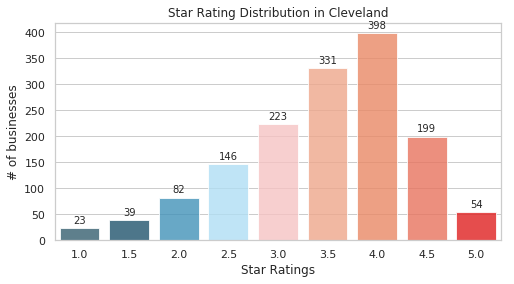

In [19]:
x = CL['stars'].value_counts()
x = x.sort_index()

plt.figure(figsize=(8,4))
ax = sns.barplot(x.index, x.values, alpha = 0.8, palette = my_pal)
plt.title("Star Rating Distribution in Cleveland")
plt.ylabel("# of businesses", fontsize=12)
plt.xlabel("Star Ratings", fontsize=12)

rects = ax.patches
labels = x.values
for rect, label in zip(rects, labels):
    height = rect.get_height()
    ax.text(rect.get_x() + rect.get_width()/2, height + 5, label, ha='center', va = 'bottom')
plt.show()

#### We want to explore if people in different city have different tends in giving extreme ratings (5 or 1) for catering businesses

In [20]:
x1t = LV['stars'].value_counts()
x1 = x1t.sort_index().tolist()[8]
x14 = x1t.sort_index().tolist()[0]

x2t = PH['stars'].value_counts()
x2 = x2t.sort_index().tolist()[8]
x24 = x2t.sort_index().tolist()[0]

x3t = PI['stars'].value_counts()
x3 = x3t.sort_index().tolist()[8]
x34 = x3t.sort_index().tolist()[0]

x4t = CH['stars'].value_counts()
x4 = x4t.sort_index().tolist()[8]
x44 = x4t.sort_index().tolist()[0]

x5t = CL['stars'].value_counts()
x5 = x5t.sort_index().tolist()[8]
x54 = x5t.sort_index().tolist()[0]

rating5 = [(x1)/len( LV['stars'].tolist()), (x2)/len( PH['stars'].tolist()), (x3)/len( CH['stars'].tolist()), (x4)/len( PI['stars'].tolist()), (x5)/len( CL['stars'].tolist())]
rating5 = [x * 100 for x in rating5]

cityList = ['Las Vegas', 'Phoenix','Charlotte', 'Pittsburgh', 'Cleveland']

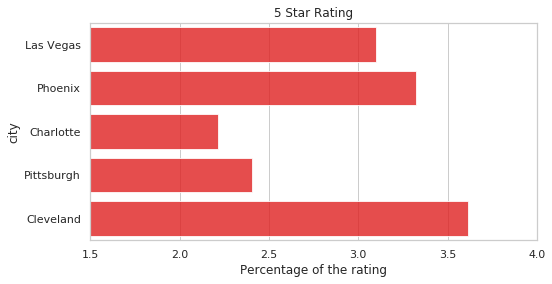

In [21]:
plt.figure(figsize=(8,4))
ax = sns.barplot(rating5, cityList, alpha = 0.8, color=(1,0,0) )
plt.title("5 Star Rating")
plt.ylabel("city", fontsize=12)
plt.xlabel("Percentage of the rating", fontsize=12)
plt.xlim((1.5, 4.0)) 

rects = ax.patches
labels = x.values/len(x)
for rect, label in zip(rects, labels):
    height = rect.get_height()
    
plt.show()


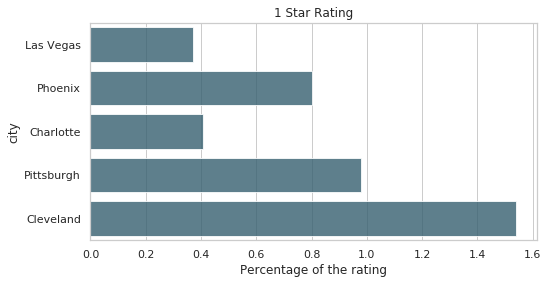

In [22]:
rating1 = [(x14)/len( LV['stars'].tolist()), (x24)/len( PH['stars'].tolist()), (x34)/len( CH['stars'].tolist()), (x44)/len( PI['stars'].tolist()), (x54)/len( CL['stars'].tolist())]
rating1 = [x * 100 for x in rating1]

plt.figure(figsize=(8,4))
ax = sns.barplot(rating1, cityList, alpha = 0.8, color=(44/255, 99/255, 122/255))
plt.title("1 Star Rating")
plt.ylabel("city", fontsize=12)
plt.xlabel("Percentage of the rating", fontsize=12)

rects = ax.patches
labels = x.values/len(x)
for rect, label in zip(rects, labels):
    height = rect.get_height()
    
plt.show()



In [23]:
x1t = LV['stars'].value_counts()
x1 = x1t.sort_index().tolist()[8]
x14 = x1t.sort_index().tolist()[7]

x2t = PH['stars'].value_counts()
x2 = x2t.sort_index().tolist()[8]
x24 = x2t.sort_index().tolist()[7]

x3t = PI['stars'].value_counts()
x3 = x3t.sort_index().tolist()[8]
x34 = x3t.sort_index().tolist()[7]

x4t = CH['stars'].value_counts()
x4 = x4t.sort_index().tolist()[8]
x44 = x4t.sort_index().tolist()[7]

x5t = CL['stars'].value_counts()
x5 = x5t.sort_index().tolist()[8]
x54 = x5t.sort_index().tolist()[7]

rating5 = [(x1+x14)/len( LV['stars'].tolist()), (x2+x24)/len( PH['stars'].tolist()), (x3+x34)/len( CH['stars'].tolist()), (x4+x44)/len( PI['stars'].tolist()), (x5+x54)/len( CL['stars'].tolist())]
rating5 = [x * 100 for x in rating5]

cityList = ['Las Vegas', 'Phoenix','Charlotte', 'Pittsburgh', 'Cleveland']

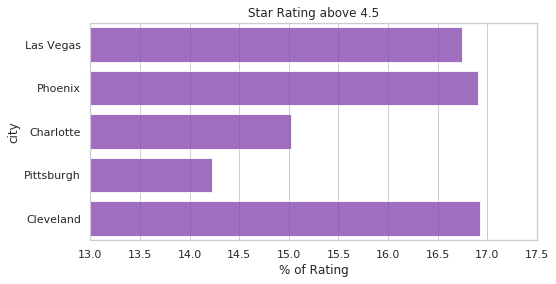

In [24]:
plt.figure(figsize=(8,4))
ax = sns.barplot(rating5, cityList, alpha = 0.8, color = (139/255, 57/255, 191/255))
plt.title("Star Rating above 4.5")
plt.ylabel("city", fontsize=12)
plt.xlabel("% of Rating", fontsize=12)
plt.xlim((13, 17.5)) 

rects = ax.patches
labels = x.values/len(x)
for rect, label in zip(rects, labels):
    height = rect.get_height()

plt.show()

#### Clean dataset and explore catering business category distribution

There are 761 different types/categories of Businesses in Yelp!


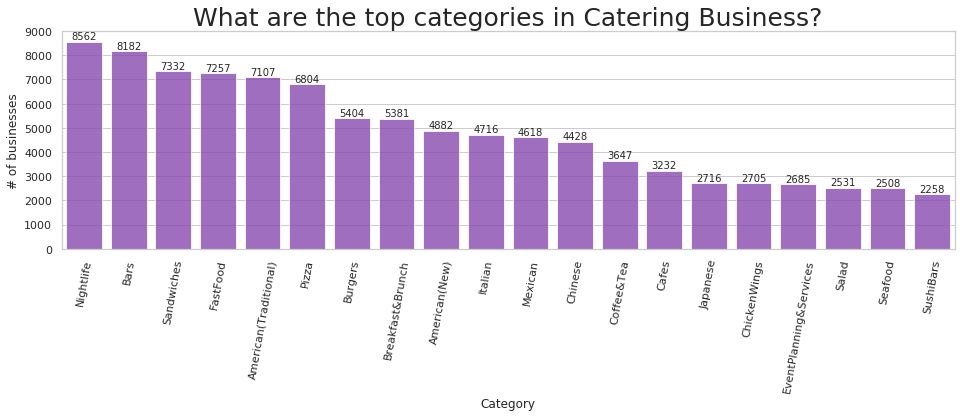

In [25]:
business_cats=','.join([str(x).replace(" ", "") for x in business['categories']])

cats=pd.DataFrame(business_cats.split(','),columns=['category'])
x=cats.category.value_counts()
print("There are",len(x),"different types/categories of Businesses in Yelp!")

#prep for chart
x=x.sort_values(ascending=False)
x=x.iloc[2:22]

#chart
plt.figure(figsize=(16,4))
ax = sns.barplot(x.index, x.values, alpha=0.8,color=(139/255, 57/255, 191/255))
plt.title("What are the top categories in Catering Business?",fontsize=25)
locs, labels = plt.xticks()
plt.setp(labels, rotation=80)
plt.ylabel('# of businesses', fontsize=12)
plt.xlabel('Category', fontsize=12)

#adding the text labels
rects = ax.patches
labels = x.values
for rect, label in zip(rects, labels):
    height = rect.get_height()
    ax.text(rect.get_x() + rect.get_width()/2, height + 5, label, ha='center', va='bottom')

plt.show()

There are 463 different types/categories of Businesses in Las Vegas!


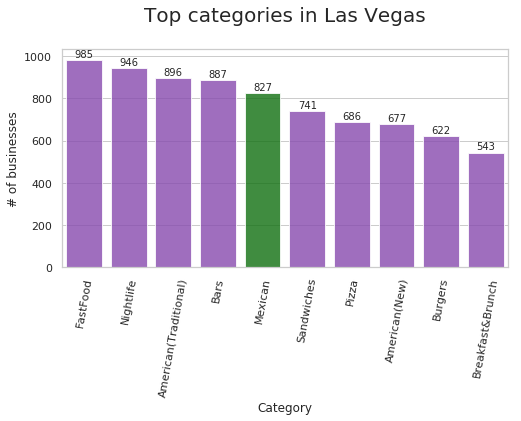

In [26]:
las_vegas = business[business.city == 'Las Vegas']
business_cats=','.join([str(x).replace(" ", "") for x in las_vegas['categories']])

cats=pd.DataFrame(business_cats.split(','),columns=['category'])
x=cats.category.value_counts()
print("There are",len(x),"different types/categories of Businesses in Las Vegas!")

#prep for chart
x=x.sort_values(ascending=False)
x=x.iloc[2:12]

highlight_LV = {categories: (0,128/255,0) if categories == "Mexican" else (139/255, 57/255, 191/255) for categories in cats.category.unique()}

#chart
plt.figure(figsize=(8,4))
ax = sns.barplot(x.index, x.values, alpha=0.8, palette = highlight_LV)
plt.title("Top categories in Las Vegas\n",fontsize=20)
locs, labels = plt.xticks()
plt.setp(labels, rotation=80)
plt.ylabel('# of businesses', fontsize=12)
plt.xlabel('Category', fontsize=12)

#adding the text labels
rects = ax.patches
labels = x.values
for rect, label in zip(rects, labels):
    height = rect.get_height()
    ax.text(rect.get_x() + rect.get_width()/2, height + 5, label, ha='center', va='bottom')

plt.show()


There are 365 different types/categories of Businesses in Phoenix!


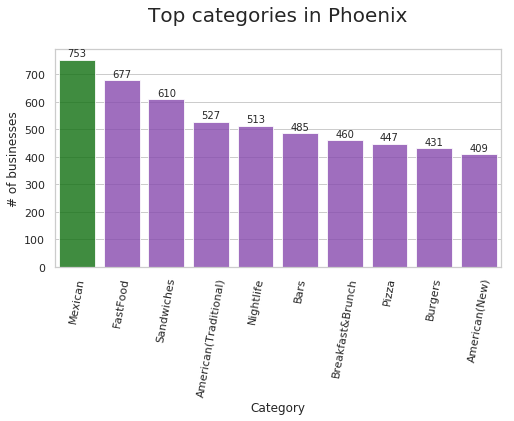

In [27]:
Phoenix = business[business.city == 'Phoenix']
business_cats=','.join([str(x).replace(" ", "") for x in Phoenix['categories']])


cats=pd.DataFrame(business_cats.split(','),columns=['category'])
x=cats.category.value_counts()
print("There are",len(x),"different types/categories of Businesses in Phoenix!")

#prep for chart
x=x.sort_values(ascending=False)
x=x.iloc[2:12]

#chart
plt.figure(figsize=(8,4))
ax = sns.barplot(x.index, x.values, alpha=0.8, palette = highlight_LV)
plt.title("Top categories in Phoenix\n",fontsize=20)
locs, labels = plt.xticks()
plt.setp(labels, rotation=80)
plt.ylabel('# of businesses', fontsize=12)
plt.xlabel('Category', fontsize=12)

#adding the text labels
rects = ax.patches
labels = x.values
for rect, label in zip(rects, labels):
    height = rect.get_height()
    ax.text(rect.get_x() + rect.get_width()/2, height + 5, label, ha='center', va='bottom')

plt.show()

There are 296 different types/categories of Businesses in Charlotte!


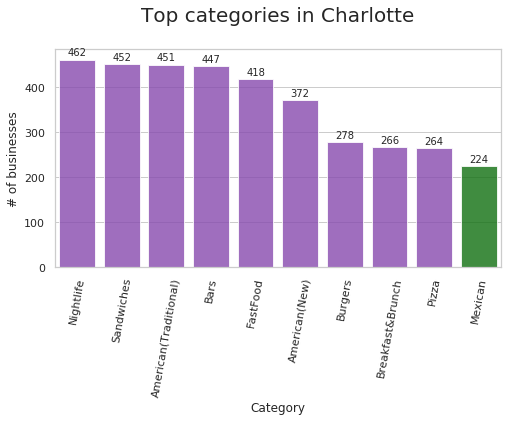

In [28]:
Charlotte = business[business.city == 'Charlotte']
business_cats=','.join([str(x).replace(" ", "") for x in Charlotte['categories']])

cats=pd.DataFrame(business_cats.split(','),columns=['category'])
x=cats.category.value_counts()
print("There are",len(x),"different types/categories of Businesses in Charlotte!")

#prep for chart
x=x.sort_values(ascending=False)
x=x.iloc[2:12]

#chart
plt.figure(figsize=(8,4))
ax = sns.barplot(x.index, x.values, alpha=0.8, palette =  highlight_LV)
plt.title("Top categories in Charlotte\n",fontsize=20)
locs, labels = plt.xticks()
plt.setp(labels, rotation=80)
plt.ylabel('# of businesses', fontsize=12)
plt.xlabel('Category', fontsize=12)

#adding the text labels
rects = ax.patches
labels = x.values
for rect, label in zip(rects, labels):
    height = rect.get_height()
    ax.text(rect.get_x() + rect.get_width()/2, height + 5, label, ha='center', va='bottom')

plt.show()

There are 286 different types/categories of Businesses in Pittsburgh!


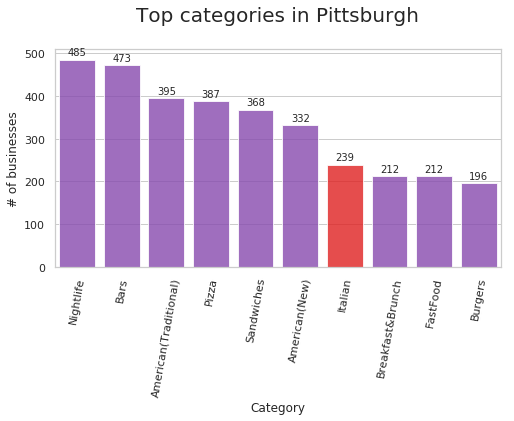

In [29]:
Pittsburgh = business[business.city == 'Pittsburgh']
business_cats=','.join([str(x).replace(" ", "") for x in Pittsburgh['categories']])

cats=pd.DataFrame(business_cats.split(','),columns=['category'])
x=cats.category.value_counts()
print("There are",len(x),"different types/categories of Businesses in Pittsburgh!")
#prep for chart
x=x.sort_values(ascending=False)
x=x.iloc[2:12]

highlight_PH = {categories: (1,0,0) if categories == "Italian" else (139/255, 57/255, 191/255) for categories in cats.category.unique()}

#chart
plt.figure(figsize=(8,4))
ax = sns.barplot(x.index, x.values, alpha=0.8, palette= highlight_PH)
plt.title("Top categories in Pittsburgh\n",fontsize=20)
locs, labels = plt.xticks()
plt.setp(labels, rotation=80)
plt.ylabel('# of businesses', fontsize=12)
plt.xlabel('Category', fontsize=12)

#adding the text labels
rects = ax.patches
labels = x.values
for rect, label in zip(rects, labels):
    height = rect.get_height()
    ax.text(rect.get_x() + rect.get_width()/2, height + 5, label, ha='center', va='bottom')

plt.show()

There are 249 different types/categories of Businesses in Cleveland!


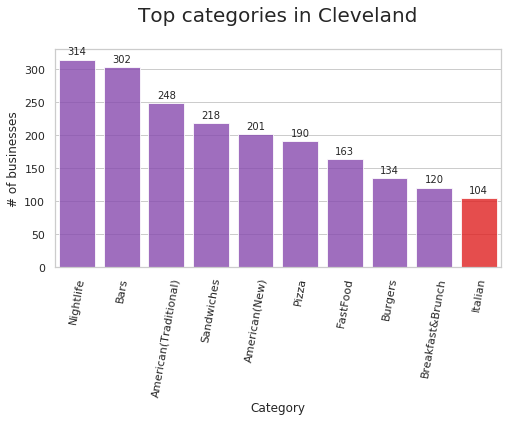

In [30]:
Cleveland = business[business.city == 'Cleveland']
business_cats=','.join([str(x).replace(" ", "") for x in Cleveland['categories']])

cats=pd.DataFrame(business_cats.split(','),columns=['category'])
x=cats.category.value_counts()
print("There are",len(x),"different types/categories of Businesses in Cleveland!")
#prep for chart
x=x.sort_values(ascending=False)
x=x.iloc[2:12]

#chart
plt.figure(figsize=(8,4))
ax = sns.barplot(x.index, x.values, alpha=0.8, palette= highlight_PH)
plt.title("Top categories in Cleveland\n",fontsize=20)
locs, labels = plt.xticks()
plt.setp(labels, rotation=80)
plt.ylabel('# of businesses', fontsize=12)
plt.xlabel('Category', fontsize=12)

#adding the text labels
rects = ax.patches
labels = x.values
for rect, label in zip(rects, labels):
    height = rect.get_height()
    ax.text(rect.get_x() + rect.get_width()/2, height + 5, label, ha='center', va='bottom')

plt.show()

There are 367 different types/categories of Businesses in Toronto!


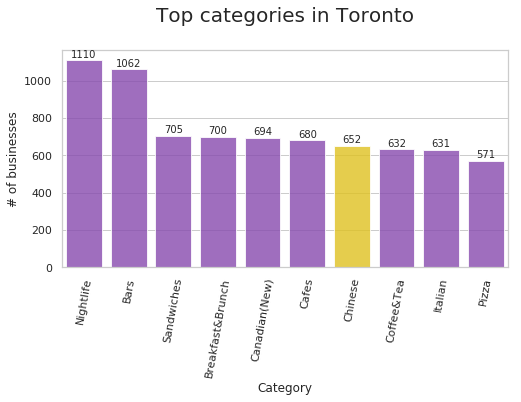

In [31]:
Toronto = business[business.city == 'Toronto']
business_cats=','.join([str(x).replace(" ", "") for x in Toronto['categories']])


cats=pd.DataFrame(business_cats.split(','),columns=['category'])
x=cats.category.value_counts()
print("There are",len(x),"different types/categories of Businesses in Toronto!")
#prep for chart
x=x.sort_values(ascending=False)
x=x.iloc[2:12]

highlight_TO = {categories: (255/255,215/255,0) if categories == "Chinese" else (139/255, 57/255, 191/255) for categories in cats.category.unique()}

#chart
plt.figure(figsize=(8,4))
ax = sns.barplot(x.index, x.values, alpha=0.8, palette = highlight_TO)
plt.title("Top categories in Toronto\n",fontsize=20)
locs, labels = plt.xticks()
plt.setp(labels, rotation=80)
plt.ylabel('# of businesses', fontsize=12)
plt.xlabel('Category', fontsize=12)

#adding the text labels
rects = ax.patches
labels = x.values
for rect, label in zip(rects, labels):
    height = rect.get_height()
    ax.text(rect.get_x() + rect.get_width()/2, height + 5, label, ha='center', va='bottom')

plt.show()

There are 299 different types/categories of Businesses in Montréal!


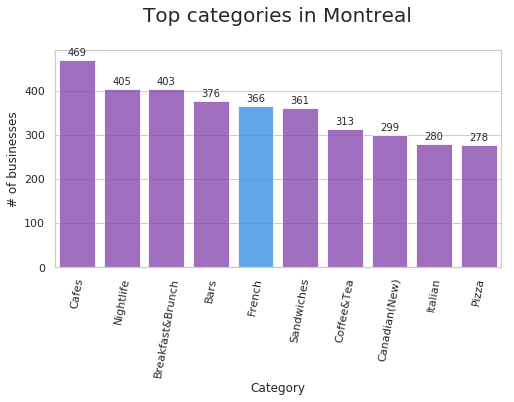

In [32]:
Montreal = business[business.city == 'Montréal']
business_cats=','.join([str(x).replace(" ", "") for x in Montreal['categories']])

cats=pd.DataFrame(business_cats.split(','),columns=['category'])
x=cats.category.value_counts()
print("There are",len(x),"different types/categories of Businesses in Montréal!")

#prep for chart
x=x.sort_values(ascending=False)
x=x.iloc[2:12]

highlight_TO = {categories: (30/255,144/255,255/255) if categories == "French" else (139/255, 57/255, 191/255) for categories in cats.category.unique()}

#chart
plt.figure(figsize=(8,4))
ax = sns.barplot(x.index, x.values, alpha=0.8, palette = highlight_TO)
plt.title("Top categories in Montreal\n",fontsize=20)
locs, labels = plt.xticks()
plt.setp(labels, rotation=80)
plt.ylabel('# of businesses', fontsize=12)
plt.xlabel('Category', fontsize=12)

#adding the text labels
rects = ax.patches
labels = x.values
for rect, label in zip(rects, labels):
    height = rect.get_height()
    ax.text(rect.get_x() + rect.get_width()/2, height + 5, label, ha='center', va='bottom')

plt.show()


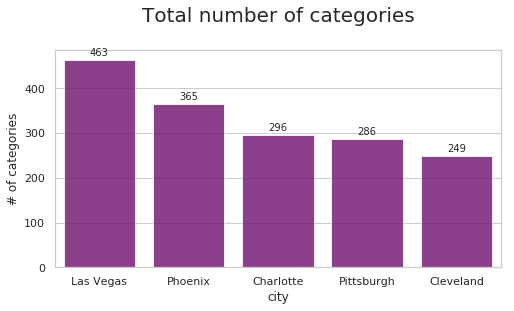

In [33]:
cat_no_list = [463,365,296,286,249]
plt.figure(figsize=(8,4))
ax = sns.barplot(cityList, cat_no_list, alpha=0.8, color= 'purple')
plt.title("Total number of categories\n",fontsize=20)
locs, labels = plt.xticks()

plt.ylabel('# of categories', fontsize=12)
plt.xlabel('city', fontsize=12)

#adding the text labels
rects = ax.patches
labels = x.values
for rect, label in zip(rects, cat_no_list):
    height = rect.get_height()
    ax.text(rect.get_x() + rect.get_width()/2, height + 5, label, ha='center', va='bottom')

plt.show()



#### Correlation between stars of rating, review counts and categories

##### Analysis on the whole business datase

In [34]:
categoryDict = {}

for index, row in business.iterrows():
    categories = row['categories'].replace(' ', '').split(',')
    for category in categories:
        category = category
        if category != 'Restaurants':
            if category not in categoryDict:
                categoryDict[category] = {}
                categoryDict[category]['stars'] = []
                categoryDict[category]['review_count'] = []
            categoryDict[category]['stars'].append(row['stars'])
            categoryDict[category]['review_count'].append(row['review_count'])

for category, value in categoryDict.items():
    categoryDict[category]['count'] = len(value['stars'])        
    
sortedCategoryList = sorted(categoryDict, key=lambda x: (categoryDict[x]['count'], categoryDict[x]['stars']))[-2:-22:-1]
avgStarList = []
avgReviewCountList = []
countList = []

for category in sortedCategoryList:
    avg_star = sum(categoryDict[category]['stars']) / len(categoryDict[category]['stars'])
    avg_review_count = sum(categoryDict[category]['review_count']) / len(categoryDict[category]['review_count'])
    avgStarList.append(avg_star)
    avgReviewCountList.append(avg_review_count)
    countList.append(categoryDict[category]['count'])

zippedList =  list(zip(sortedCategoryList, avgStarList, avgReviewCountList, countList))    
categoryDf = pd.DataFrame(zippedList, columns = ['category' , 'avg_star', 'avg_review_count', 'count']) 


#### Average star of ratings by category

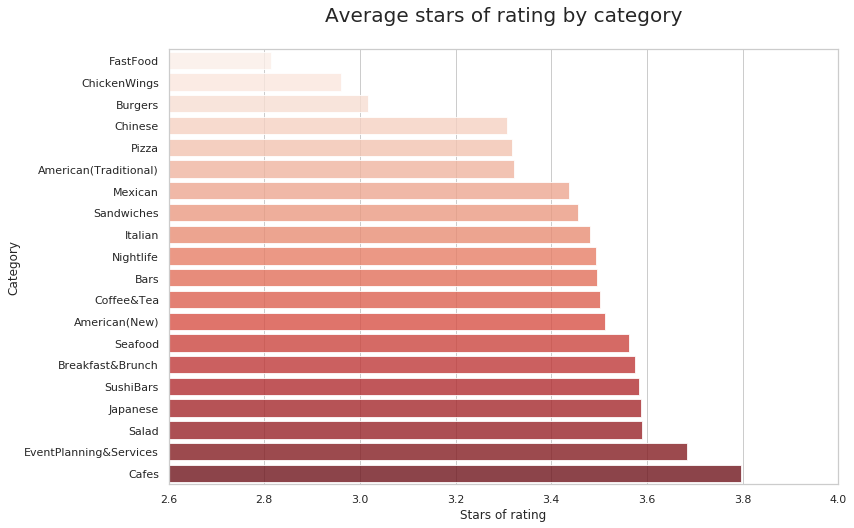

In [35]:
sorted_star = categoryDf.sort_values(by=['avg_star'])
    
plt.figure(figsize=(12,8))
ax = sns.barplot(sorted_star.avg_star, sorted_star.category, alpha=0.8, palette='Reds')
plt.title("Average stars of rating by category\n", fontsize=20)
locs, labels = plt.xticks()
plt.ylabel('Category', fontsize=12)
plt.xlabel('Stars of rating', fontsize=12)
plt.xlim((2.6, 4.0))  

#adding the text labels
rects = ax.patches
labels = sorted_star.avg_star
for rect, label in zip(rects, labels):
    height = rect.get_height()

plt.show()


#### Average star of ratings and number of business counts by category

In [36]:
sorted_category = categoryDf.sort_values(by=['category'])

sizeList = [x / 200 for x in sorted_category['count'].tolist()]
textList = ['Business count: {}'.format(count) for star, count in zip(sorted_category.avg_star.tolist(), sorted_category['count'].tolist())]

trace = go.Scatter(   
    x=sorted_category.category.tolist(),
    y=[round(y, 2) for y in sorted_category.avg_star.tolist()],
    text=textList,
    mode='markers',
    marker=dict(
        size=sizeList,
        color='red',
    )
)

layout = go.Layout(
    title='Average stars of rating and number of business counts by category',
    xaxis=dict(
        title='Business Categories',
        gridcolor='rgb(255, 255, 255)',
        zerolinewidth=1,
        ticklen=5,
        gridwidth=2,
    ),
    yaxis=dict(
        title='Average Star Rating',
        gridcolor='rgb(255, 255, 255)',
        zerolinewidth=1,
        ticklen=5,
        gridwidth=2,
    ),
    paper_bgcolor='rgb(243, 243, 243)',
    plot_bgcolor='rgb(243, 243, 243)',
)

fig = go.Figure(data = [trace], layout = layout)
py.offline.iplot(fig, filename='bubblechart-business')

#### Average review counts by category

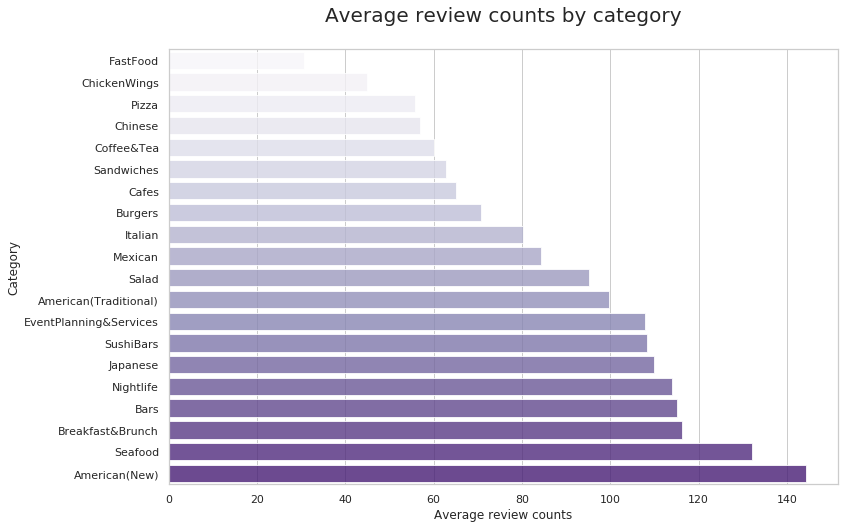

In [37]:
sorted_review_count = categoryDf.sort_values(by=['avg_review_count'])
    
plt.figure(figsize=(12,8))
ax = sns.barplot(sorted_review_count.avg_review_count, sorted_review_count.category, alpha=0.8, palette='Purples')
plt.title("Average review counts by category\n", fontsize=20)
locs, labels = plt.xticks()
plt.ylabel('Category', fontsize=12)
plt.xlabel('Average review counts', fontsize=12) 

rects = ax.patches
labels = sorted_star.avg_star
for rect, label in zip(rects, labels):
    height = rect.get_height()

plt.show()

#### Average star of ratings and average review counts by category

In [38]:
sorted_category = categoryDf.sort_values(by=['category'])

sizeList = [x / 2 for x in sorted_category.avg_review_count.tolist()]
textList = ['Average review count: {:.0f}'.format(review_count) for star, review_count in zip(sorted_category.avg_star.tolist(), sorted_category.avg_review_count.tolist())]

trace = go.Scatter(   
    x=sorted_category.category.tolist(),
    y=[round(y, 2) for y in sorted_category.avg_star.tolist()],
    text=textList,
    mode='markers',
    marker=dict(
        size=sizeList,
        color='purple',
    )
)

layout = go.Layout(
    title='Average stars of rating and average review counts by category',
    xaxis=dict(
        title='Business Categories',
        gridcolor='rgb(255, 255, 255)',
        zerolinewidth=1,
        ticklen=5,
        gridwidth=2,
    ),
    yaxis=dict(
        title='Average Star Rating',
        gridcolor='rgb(255, 255, 255)',
        zerolinewidth=1,
        ticklen=5,
        gridwidth=2,
    ),
    paper_bgcolor='rgb(243, 243, 243)',
    plot_bgcolor='rgb(243, 243, 243)',
)

fig = go.Figure(data = [trace], layout = layout)
py.offline.iplot(fig, filename='bubblechart-business')

#### Analysis on Las Vegas

In [39]:
categoryDict = {}

for index, row in las_vegas.iterrows():
    categories = row['categories'].replace(' ', '').split(',')
    for category in categories:
        category = category
        if category != 'Restaurants':
            if category not in categoryDict:
                categoryDict[category] = {}
                categoryDict[category]['stars'] = []
                categoryDict[category]['review_count'] = []
            categoryDict[category]['stars'].append(row['stars'])
            categoryDict[category]['review_count'].append(row['review_count'])

for category, value in categoryDict.items():
    categoryDict[category]['count'] = len(value['stars'])        
    
sortedCategoryList = sorted(categoryDict, key=lambda x: (categoryDict[x]['count'], categoryDict[x]['stars']))[-2:-22:-1]
avgStarList = []
avgReviewCountList = []
countList = []

for category in sortedCategoryList:
    avg_star = sum(categoryDict[category]['stars']) / len(categoryDict[category]['stars'])
    avg_review_count = sum(categoryDict[category]['review_count']) / len(categoryDict[category]['review_count'])
    avgStarList.append(avg_star)
    avgReviewCountList.append(avg_review_count)
    countList.append(categoryDict[category]['count'])

zippedList =  list(zip(sortedCategoryList, avgStarList, avgReviewCountList, countList))    
categoryDf = pd.DataFrame(zippedList, columns = ['category' , 'avg_star', 'avg_review_count', 'count']) 


#### Average star of ratings by category

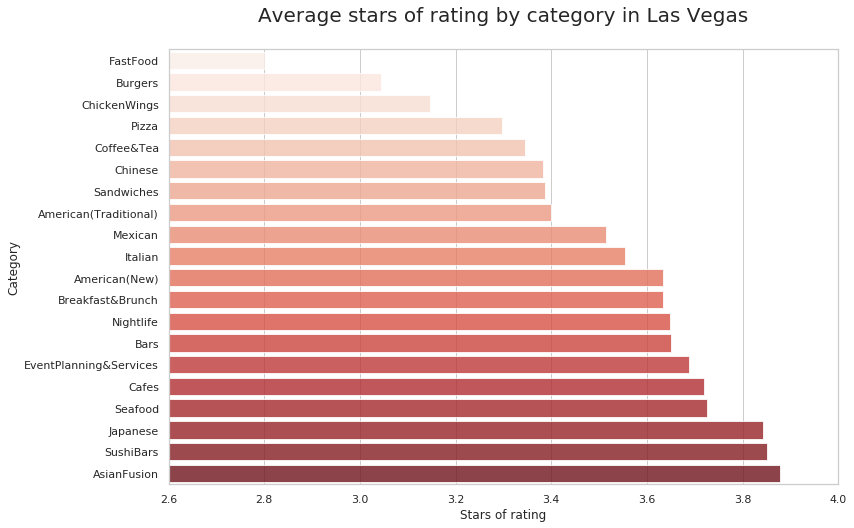

In [40]:
sorted_star = categoryDf.sort_values(by=['avg_star'])
    
plt.figure(figsize=(12,8))
ax = sns.barplot(sorted_star.avg_star, sorted_star.category, alpha=0.8, palette='Reds')
plt.title("Average stars of rating by category in Las Vegas\n", fontsize=20)
locs, labels = plt.xticks()
plt.ylabel('Category', fontsize=12)
plt.xlabel('Stars of rating', fontsize=12)
plt.xlim((2.6, 4.0))  

#adding the text labels
rects = ax.patches
labels = sorted_star.avg_star
for rect, label in zip(rects, labels):
    height = rect.get_height()

plt.show()


#### Average star of ratings and number of business counts by category

In [41]:
sorted_category = categoryDf.sort_values(by=['category'])

sizeList = [x / 10 for x in sorted_category['count'].tolist()]
textList = ['Business count: {}'.format(count) for star, count in zip(sorted_category.avg_star.tolist(), sorted_category['count'].tolist())]

trace = go.Scatter(   
    x=sorted_category.category.tolist(),
    y=[round(y, 2) for y in sorted_category.avg_star.tolist()],
    text=textList,
    mode='markers',
    marker=dict(
        size=sizeList,
        color='red',
    )
)

layout = go.Layout(
    title='Average stars of rating and number of business counts by category in Las Vegas',
    xaxis=dict(
        title='Business Categories',
        gridcolor='rgb(255, 255, 255)',
        zerolinewidth=1,
        ticklen=5,
        gridwidth=2,
    ),
    yaxis=dict(
        title='Average Star Rating',
        gridcolor='rgb(255, 255, 255)',
        zerolinewidth=1,
        ticklen=5,
        gridwidth=2,
    ),
    paper_bgcolor='rgb(243, 243, 243)',
    plot_bgcolor='rgb(243, 243, 243)',
)

fig = go.Figure(data = [trace], layout = layout)
py.offline.iplot(fig, filename='bubblechart-business')

#### Average review counts by category

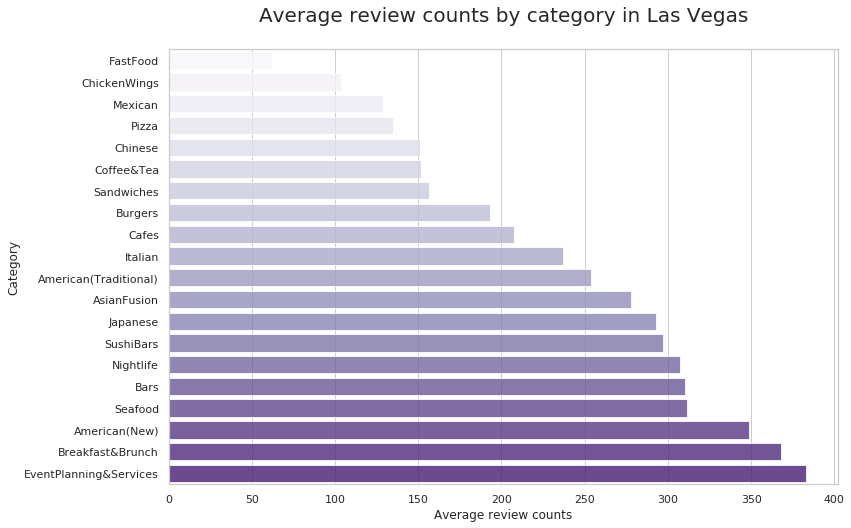

In [42]:
sorted_review_count = categoryDf.sort_values(by=['avg_review_count'])
    
plt.figure(figsize=(12,8))
ax = sns.barplot(sorted_review_count.avg_review_count, sorted_review_count.category, alpha=0.8, palette='Purples')
plt.title("Average review counts by category in Las Vegas\n", fontsize=20)
locs, labels = plt.xticks()
plt.ylabel('Category', fontsize=12)
plt.xlabel('Average review counts', fontsize=12) 

rects = ax.patches
labels = sorted_star.avg_star
for rect, label in zip(rects, labels):
    height = rect.get_height()

plt.show()

#### Average star of ratings and average review counts by category

In [43]:
sorted_category = categoryDf.sort_values(by=['category'])

sizeList = [x / 5 for x in sorted_category.avg_review_count.tolist()]
textList = ['Average review count: {:.0f}'.format(review_count) for star, review_count in zip(sorted_category.avg_star.tolist(), sorted_category.avg_review_count.tolist())]

trace = go.Scatter(   
    x=sorted_category.category.tolist(),
    y=[round(y, 2) for y in sorted_category.avg_star.tolist()],
    text=textList,
    mode='markers',
    marker=dict(
        size=sizeList,
        color='purple',
    )
)

layout = go.Layout(
    title='Average stars of rating and average review counts by category in Las Vegas',
    xaxis=dict(
        title='Business Categories',
        gridcolor='rgb(255, 255, 255)',
        zerolinewidth=1,
        ticklen=5,
        gridwidth=2,
    ),
    yaxis=dict(
        title='Average Star Rating',
        gridcolor='rgb(255, 255, 255)',
        zerolinewidth=1,
        ticklen=5,
        gridwidth=2,
    ),
    paper_bgcolor='rgb(243, 243, 243)',
    plot_bgcolor='rgb(243, 243, 243)',
)

fig = go.Figure(data = [trace], layout = layout)
py.offline.iplot(fig, filename='bubblechart-business')

##### Analysis on Phoenix

In [44]:
categoryDict = {}

for index, row in Phoenix.iterrows():
    categories = row['categories'].replace(' ', '').split(',')
    for category in categories:
        category = category
        if category != 'Restaurants':
            if category not in categoryDict:
                categoryDict[category] = {}
                categoryDict[category]['stars'] = []
                categoryDict[category]['review_count'] = []
            categoryDict[category]['stars'].append(row['stars'])
            categoryDict[category]['review_count'].append(row['review_count'])

for category, value in categoryDict.items():
    categoryDict[category]['count'] = len(value['stars'])        
    
sortedCategoryList = sorted(categoryDict, key=lambda x: (categoryDict[x]['count'], categoryDict[x]['stars']))[-2:-22:-1]
avgStarList = []
avgReviewCountList = []
countList = []

for category in sortedCategoryList:
    avg_star = sum(categoryDict[category]['stars']) / len(categoryDict[category]['stars'])
    avg_review_count = sum(categoryDict[category]['review_count']) / len(categoryDict[category]['review_count'])
    avgStarList.append(avg_star)
    avgReviewCountList.append(avg_review_count)
    countList.append(categoryDict[category]['count'])

zippedList =  list(zip(sortedCategoryList, avgStarList, avgReviewCountList, countList))    
categoryDf = pd.DataFrame(zippedList, columns = ['category' , 'avg_star', 'avg_review_count', 'count']) 


#### Average star of ratings by category

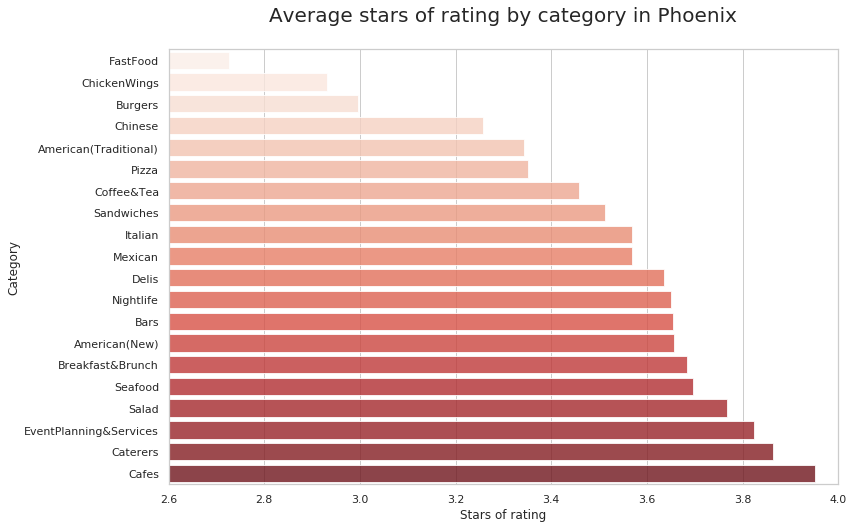

In [45]:
sorted_star = categoryDf.sort_values(by=['avg_star'])
    
plt.figure(figsize=(12,8))
ax = sns.barplot(sorted_star.avg_star, sorted_star.category, alpha=0.8, palette='Reds')
plt.title("Average stars of rating by category in Phoenix\n", fontsize=20)
locs, labels = plt.xticks()
plt.ylabel('Category', fontsize=12)
plt.xlabel('Stars of rating', fontsize=12)
plt.xlim((2.6, 4.0))  

#adding the text labels
rects = ax.patches
labels = sorted_star.avg_star
for rect, label in zip(rects, labels):
    height = rect.get_height()

plt.show()


#### Average star of ratings and number of business counts by category

In [46]:
sorted_category = categoryDf.sort_values(by=['category'])

sizeList = [x / 10 for x in sorted_category['count'].tolist()]
textList = ['Business count: {}'.format(count) for star, count in zip(sorted_category.avg_star.tolist(), sorted_category['count'].tolist())]

trace = go.Scatter(   
    x=sorted_category.category.tolist(),
    y=[round(y, 2) for y in sorted_category.avg_star.tolist()],
    text=textList,
    mode='markers',
    marker=dict(
        size=sizeList,
        color='red',
    )
)

layout = go.Layout(
    title='Average stars of rating and number of business counts by category in Phoenix',
    xaxis=dict(
        title='Business Categories',
        gridcolor='rgb(255, 255, 255)',
        zerolinewidth=1,
        ticklen=5,
        gridwidth=2,
    ),
    yaxis=dict(
        title='Average Star Rating',
        gridcolor='rgb(255, 255, 255)',
        zerolinewidth=1,
        ticklen=5,
        gridwidth=2,
    ),
    paper_bgcolor='rgb(243, 243, 243)',
    plot_bgcolor='rgb(243, 243, 243)',
)

fig = go.Figure(data = [trace], layout = layout)
py.offline.iplot(fig, filename='bubblechart-business')

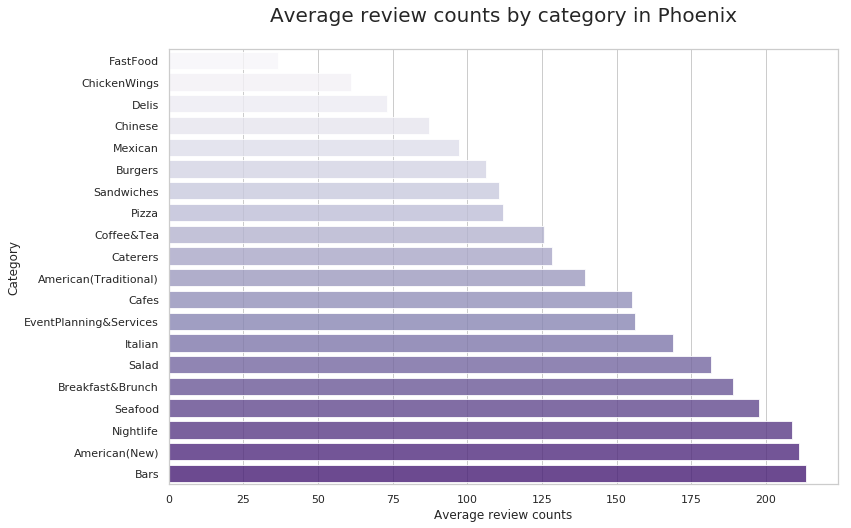

In [47]:
sorted_review_count = categoryDf.sort_values(by=['avg_review_count'])
    
plt.figure(figsize=(12,8))
ax = sns.barplot(sorted_review_count.avg_review_count, sorted_review_count.category, alpha=0.8, palette='Purples')
plt.title("Average review counts by category in Phoenix\n", fontsize=20)
locs, labels = plt.xticks()
plt.ylabel('Category', fontsize=12)
plt.xlabel('Average review counts', fontsize=12) 

rects = ax.patches
labels = sorted_star.avg_star
for rect, label in zip(rects, labels):
    height = rect.get_height()

plt.show()

#### Average star of ratings and average review counts by category

In [48]:
sorted_category = categoryDf.sort_values(by=['category'])

sizeList = [x / 5 for x in sorted_category.avg_review_count.tolist()]
textList = ['Average review count: {:.0f}'.format(review_count) for star, review_count in zip(sorted_category.avg_star.tolist(), sorted_category.avg_review_count.tolist())]

trace = go.Scatter(   
    x=sorted_category.category.tolist(),
    y=[round(y, 2) for y in sorted_category.avg_star.tolist()],
    text=textList,
    mode='markers',
    marker=dict(
        size=sizeList,
        color='purple',
    )
)

layout = go.Layout(
    title='Average stars of rating and average review counts by category in Phoenix',
    xaxis=dict(
        title='Business Categories',
        gridcolor='rgb(255, 255, 255)',
        zerolinewidth=1,
        ticklen=5,
        gridwidth=2,
    ),
    yaxis=dict(
        title='Average Star Rating',
        gridcolor='rgb(255, 255, 255)',
        zerolinewidth=1,
        ticklen=5,
        gridwidth=2,
    ),
    paper_bgcolor='rgb(243, 243, 243)',
    plot_bgcolor='rgb(243, 243, 243)',
)

fig = go.Figure(data = [trace], layout = layout)
py.offline.iplot(fig, filename='bubblechart-business')

#### Analysis on Charlotte

In [49]:
categoryDict = {}

for index, row in Charlotte.iterrows():
    categories = row['categories'].replace(' ', '').split(',')
    for category in categories:
        category = category
        if category != 'Restaurants':
            if category not in categoryDict:
                categoryDict[category] = {}
                categoryDict[category]['stars'] = []
                categoryDict[category]['review_count'] = []
            categoryDict[category]['stars'].append(row['stars'])
            categoryDict[category]['review_count'].append(row['review_count'])

for category, value in categoryDict.items():
    categoryDict[category]['count'] = len(value['stars'])        
    
sortedCategoryList = sorted(categoryDict, key=lambda x: (categoryDict[x]['count'], categoryDict[x]['stars']))[-2:-22:-1]
avgStarList = []
avgReviewCountList = []
countList = []

for category in sortedCategoryList:
    avg_star = sum(categoryDict[category]['stars']) / len(categoryDict[category]['stars'])
    avg_review_count = sum(categoryDict[category]['review_count']) / len(categoryDict[category]['review_count'])
    avgStarList.append(avg_star)
    avgReviewCountList.append(avg_review_count)
    countList.append(categoryDict[category]['count'])

zippedList =  list(zip(sortedCategoryList, avgStarList, avgReviewCountList, countList))    
categoryDf = pd.DataFrame(zippedList, columns = ['category' , 'avg_star', 'avg_review_count', 'count']) 


#### Average star of ratings by category

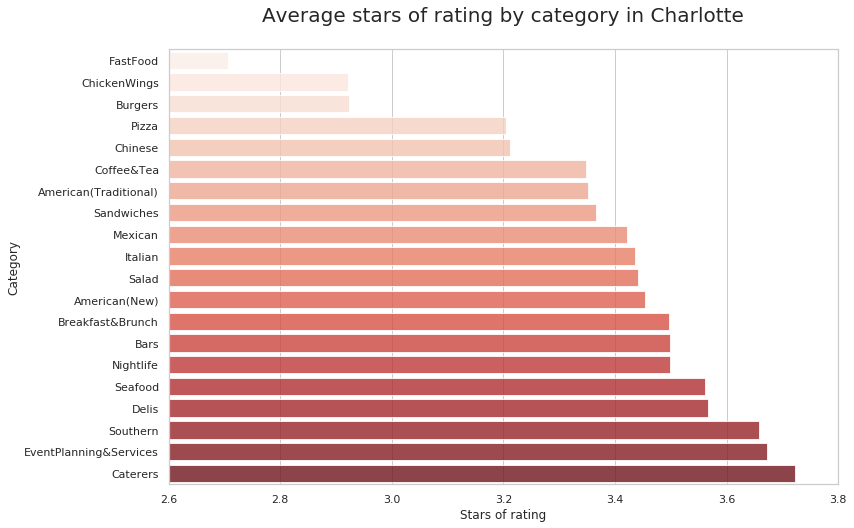

In [50]:
sorted_star = categoryDf.sort_values(by=['avg_star'])
    
plt.figure(figsize=(12,8))
ax = sns.barplot(sorted_star.avg_star, sorted_star.category, alpha=0.8, palette='Reds')
plt.title("Average stars of rating by category in Charlotte\n", fontsize=20)
locs, labels = plt.xticks()
plt.ylabel('Category', fontsize=12)
plt.xlabel('Stars of rating', fontsize=12)
plt.xlim((2.6, 3.8))  

#adding the text labels
rects = ax.patches
labels = sorted_star.avg_star
for rect, label in zip(rects, labels):
    height = rect.get_height()

plt.show()


#### Average star of ratings and number of business counts by category

In [51]:
sorted_category = categoryDf.sort_values(by=['category'])

sizeList = [x / 10 for x in sorted_category['count'].tolist()]
textList = ['Business count: {}'.format(count) for star, count in zip(sorted_category.avg_star.tolist(), sorted_category['count'].tolist())]

trace = go.Scatter(   
    x=sorted_category.category.tolist(),
    y=[round(y, 2) for y in sorted_category.avg_star.tolist()],
    text=textList,
    mode='markers',
    marker=dict(
        size=sizeList,
        color='red',
    )
)

layout = go.Layout(
    title='Average stars of rating and number of business counts by category in Charlotte',
    xaxis=dict(
        title='Business Categories',
        gridcolor='rgb(255, 255, 255)',
        zerolinewidth=1,
        ticklen=5,
        gridwidth=2,
    ),
    yaxis=dict(
        title='Average Star Rating',
        gridcolor='rgb(255, 255, 255)',
        zerolinewidth=1,
        ticklen=5,
        gridwidth=2,
    ),
    paper_bgcolor='rgb(243, 243, 243)',
    plot_bgcolor='rgb(243, 243, 243)',
)

fig = go.Figure(data = [trace], layout = layout)
py.offline.iplot(fig, filename='bubblechart-business')

#### Average review counts by category

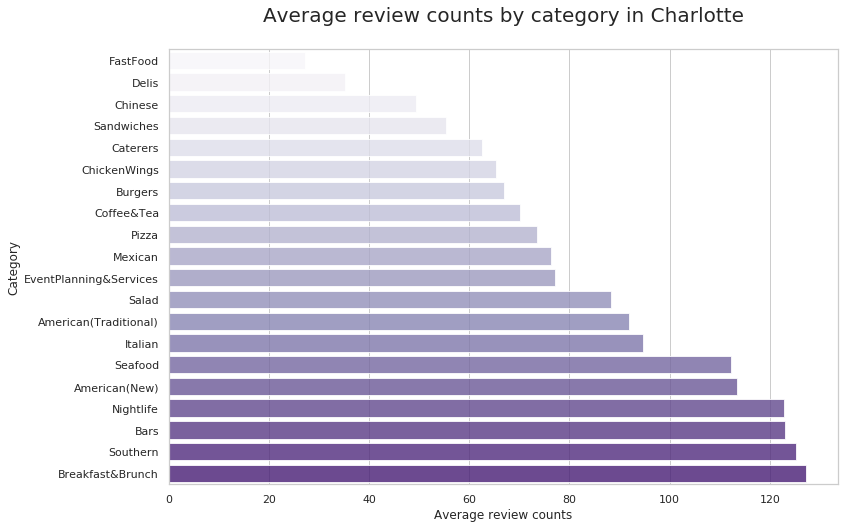

In [52]:
sorted_review_count = categoryDf.sort_values(by=['avg_review_count'])
    
plt.figure(figsize=(12,8))
ax = sns.barplot(sorted_review_count.avg_review_count, sorted_review_count.category, alpha=0.8, palette='Purples')
plt.title("Average review counts by category in Charlotte\n", fontsize=20)
locs, labels = plt.xticks()
plt.ylabel('Category', fontsize=12)
plt.xlabel('Average review counts', fontsize=12) 

rects = ax.patches
labels = sorted_star.avg_star
for rect, label in zip(rects, labels):
    height = rect.get_height()

plt.show()

#### Average star of ratings and average review counts by category

In [53]:
sorted_category = categoryDf.sort_values(by=['category'])

sizeList = [x / 5 for x in sorted_category.avg_review_count.tolist()]
textList = ['Average review count: {:.0f}'.format(review_count) for star, review_count in zip(sorted_category.avg_star.tolist(), sorted_category.avg_review_count.tolist())]

trace = go.Scatter(   
    x=sorted_category.category.tolist(),
    y=[round(y, 2) for y in sorted_category.avg_star.tolist()],
    text=textList,
    mode='markers',
    marker=dict(
        size=sizeList,
        color='purple',
    )
)

layout = go.Layout(
    title='Average stars of rating and average review counts by category in Charlotte',
    xaxis=dict(
        title='Business Categories',
        gridcolor='rgb(255, 255, 255)',
        zerolinewidth=1,
        ticklen=5,
        gridwidth=2,
    ),
    yaxis=dict(
        title='Average Star Rating',
        gridcolor='rgb(255, 255, 255)',
        zerolinewidth=1,
        ticklen=5,
        gridwidth=2,
    ),
    paper_bgcolor='rgb(243, 243, 243)',
    plot_bgcolor='rgb(243, 243, 243)',
)

fig = go.Figure(data = [trace], layout = layout)
py.offline.iplot(fig, filename='bubblechart-business')

#### Analysis on Pittsburgh

In [54]:
categoryDict = {}

for index, row in Pittsburgh.iterrows():
    categories = row['categories'].replace(' ', '').split(',')
    for category in categories:
        category = category
        if category != 'Restaurants':
            if category not in categoryDict:
                categoryDict[category] = {}
                categoryDict[category]['stars'] = []
                categoryDict[category]['review_count'] = []
            categoryDict[category]['stars'].append(row['stars'])
            categoryDict[category]['review_count'].append(row['review_count'])

for category, value in categoryDict.items():
    categoryDict[category]['count'] = len(value['stars'])        
    
sortedCategoryList = sorted(categoryDict, key=lambda x: (categoryDict[x]['count'], categoryDict[x]['stars']))[-2:-22:-1]
avgStarList = []
avgReviewCountList = []
countList = []

for category in sortedCategoryList:
    avg_star = sum(categoryDict[category]['stars']) / len(categoryDict[category]['stars'])
    avg_review_count = sum(categoryDict[category]['review_count']) / len(categoryDict[category]['review_count'])
    avgStarList.append(avg_star)
    avgReviewCountList.append(avg_review_count)
    countList.append(categoryDict[category]['count'])

zippedList =  list(zip(sortedCategoryList, avgStarList, avgReviewCountList, countList))    
categoryDf = pd.DataFrame(zippedList, columns = ['category' , 'avg_star', 'avg_review_count', 'count']) 


#### Average star of ratings by category

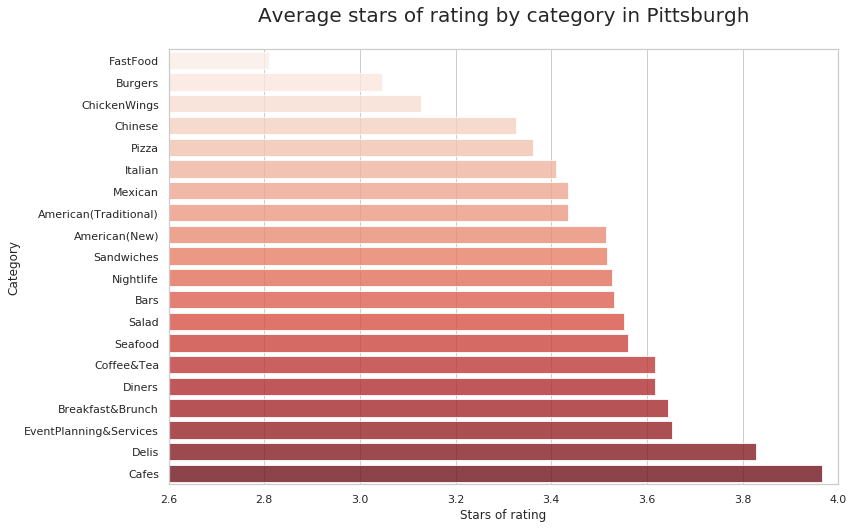

In [55]:
sorted_star = categoryDf.sort_values(by=['avg_star'])
    
plt.figure(figsize=(12,8))
ax = sns.barplot(sorted_star.avg_star, sorted_star.category, alpha=0.8, palette='Reds')
plt.title("Average stars of rating by category in Pittsburgh\n", fontsize=20)
locs, labels = plt.xticks()
plt.ylabel('Category', fontsize=12)
plt.xlabel('Stars of rating', fontsize=12)
plt.xlim((2.6, 4.0))  

#adding the text labels
rects = ax.patches
labels = sorted_star.avg_star
for rect, label in zip(rects, labels):
    height = rect.get_height()

plt.show()


#### Average star of ratings and number of business counts by category

In [56]:
sorted_category = categoryDf.sort_values(by=['category'])

sizeList = [x / 10 for x in sorted_category['count'].tolist()]
textList = ['Business count: {}'.format(count) for star, count in zip(sorted_category.avg_star.tolist(), sorted_category['count'].tolist())]

trace = go.Scatter(   
    x=sorted_category.category.tolist(),
    y=[round(y, 2) for y in sorted_category.avg_star.tolist()],
    text=textList,
    mode='markers',
    marker=dict(
        size=sizeList,
        color='red',
    )
)

layout = go.Layout(
    title='Average stars of rating and number of business counts by category in Pittsburgh',
    xaxis=dict(
        title='Business Categories',
        gridcolor='rgb(255, 255, 255)',
        zerolinewidth=1,
        ticklen=5,
        gridwidth=2,
    ),
    yaxis=dict(
        title='Average Star Rating',
        gridcolor='rgb(255, 255, 255)',
        zerolinewidth=1,
        ticklen=5,
        gridwidth=2,
    ),
    paper_bgcolor='rgb(243, 243, 243)',
    plot_bgcolor='rgb(243, 243, 243)',
)

fig = go.Figure(data = [trace], layout = layout)
py.offline.iplot(fig, filename='bubblechart-business')

#### Average review counts by category

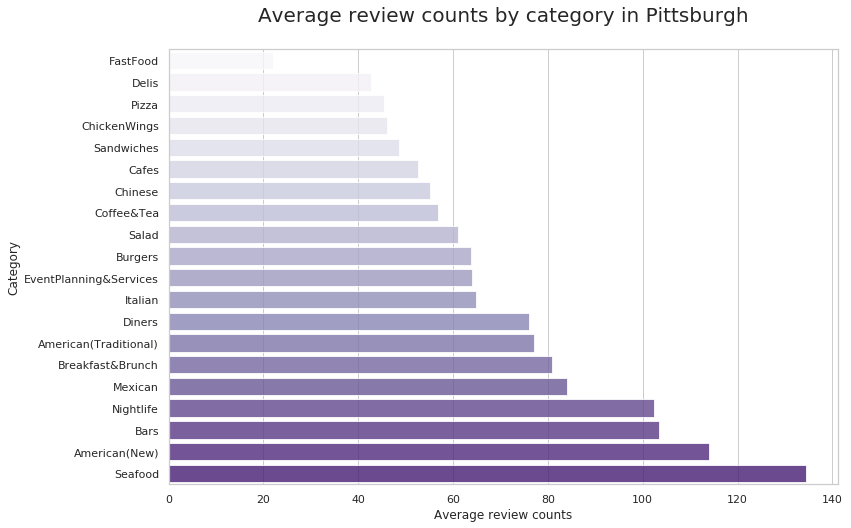

In [57]:
sorted_review_count = categoryDf.sort_values(by=['avg_review_count'])
    
plt.figure(figsize=(12,8))
ax = sns.barplot(sorted_review_count.avg_review_count, sorted_review_count.category, alpha=0.8, palette='Purples')
plt.title("Average review counts by category in Pittsburgh\n", fontsize=20)
locs, labels = plt.xticks()
plt.ylabel('Category', fontsize=12)
plt.xlabel('Average review counts', fontsize=12) 

rects = ax.patches
labels = sorted_star.avg_star
for rect, label in zip(rects, labels):
    height = rect.get_height()

plt.show()

#### Average star of ratings and average review counts by category

In [58]:
sorted_category = categoryDf.sort_values(by=['category'])

sizeList = [x / 5 for x in sorted_category.avg_review_count.tolist()]
textList = ['Average review count: {:.0f}'.format(review_count) for star, review_count in zip(sorted_category.avg_star.tolist(), sorted_category.avg_review_count.tolist())]

trace = go.Scatter(   
    x=sorted_category.category.tolist(),
    y=[round(y, 2) for y in sorted_category.avg_star.tolist()],
    text=textList,
    mode='markers',
    marker=dict(
        size=sizeList,
        color='purple',
    )
)

layout = go.Layout(
    title='Average stars of rating and average review counts by category in Pittsburgh',
    xaxis=dict(
        title='Business Categories',
        gridcolor='rgb(255, 255, 255)',
        zerolinewidth=1,
        ticklen=5,
        gridwidth=2,
    ),
    yaxis=dict(
        title='Average Star Rating',
        gridcolor='rgb(255, 255, 255)',
        zerolinewidth=1,
        ticklen=5,
        gridwidth=2,
    ),
    paper_bgcolor='rgb(243, 243, 243)',
    plot_bgcolor='rgb(243, 243, 243)',
)

fig = go.Figure(data = [trace], layout = layout)
py.offline.iplot(fig, filename='bubblechart-business')

#### Analysis on Cleveland

In [59]:
categoryDict = {}

for index, row in Cleveland.iterrows():
    categories = row['categories'].replace(' ', '').split(',')
    for category in categories:
        category = category
        if category != 'Restaurants':
            if category not in categoryDict:
                categoryDict[category] = {}
                categoryDict[category]['stars'] = []
                categoryDict[category]['review_count'] = []
            categoryDict[category]['stars'].append(row['stars'])
            categoryDict[category]['review_count'].append(row['review_count'])

for category, value in categoryDict.items():
    categoryDict[category]['count'] = len(value['stars'])        
    
sortedCategoryList = sorted(categoryDict, key=lambda x: (categoryDict[x]['count'], categoryDict[x]['stars']))[-2:-22:-1]
avgStarList = []
avgReviewCountList = []
countList = []

for category in sortedCategoryList:
    avg_star = sum(categoryDict[category]['stars']) / len(categoryDict[category]['stars'])
    avg_review_count = sum(categoryDict[category]['review_count']) / len(categoryDict[category]['review_count'])
    avgStarList.append(avg_star)
    avgReviewCountList.append(avg_review_count)
    countList.append(categoryDict[category]['count'])

zippedList =  list(zip(sortedCategoryList, avgStarList, avgReviewCountList, countList))    
categoryDf = pd.DataFrame(zippedList, columns = ['category' , 'avg_star', 'avg_review_count', 'count']) 


#### Average star of ratings by category

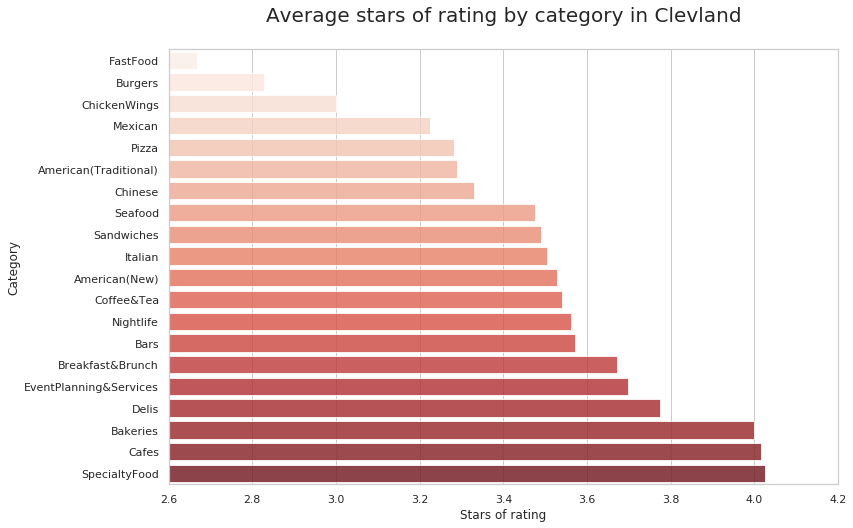

In [60]:
sorted_star = categoryDf.sort_values(by=['avg_star'])
    
plt.figure(figsize=(12,8))
ax = sns.barplot(sorted_star.avg_star, sorted_star.category, alpha=0.8, palette='Reds')
plt.title("Average stars of rating by category in Clevland\n", fontsize=20)
locs, labels = plt.xticks()
plt.ylabel('Category', fontsize=12)
plt.xlabel('Stars of rating', fontsize=12)
plt.xlim((2.6, 4.2))  

#adding the text labels
rects = ax.patches
labels = sorted_star.avg_star
for rect, label in zip(rects, labels):
    height = rect.get_height()

plt.show()


#### Average star of ratings and number of business counts by category

In [61]:
sorted_category = categoryDf.sort_values(by=['category'])

sizeList = [x / 10 for x in sorted_category['count'].tolist()]
textList = ['Business count: {}'.format(count) for star, count in zip(sorted_category.avg_star.tolist(), sorted_category['count'].tolist())]

trace = go.Scatter(   
    x=sorted_category.category.tolist(),
    y=[round(y, 2) for y in sorted_category.avg_star.tolist()],
    text=textList,
    mode='markers',
    marker=dict(
        size=sizeList,
        color='red',
    )
)

layout = go.Layout(
    title='Average stars of rating and number of business counts by category in Clevland',
    xaxis=dict(
        title='Business Categories',
        gridcolor='rgb(255, 255, 255)',
        zerolinewidth=1,
        ticklen=5,
        gridwidth=2,
    ),
    yaxis=dict(
        title='Average Star Rating',
        gridcolor='rgb(255, 255, 255)',
        zerolinewidth=1,
        ticklen=5,
        gridwidth=2,
    ),
    paper_bgcolor='rgb(243, 243, 243)',
    plot_bgcolor='rgb(243, 243, 243)',
)

fig = go.Figure(data = [trace], layout = layout)
py.offline.iplot(fig, filename='bubblechart-business')

#### Average review counts by category

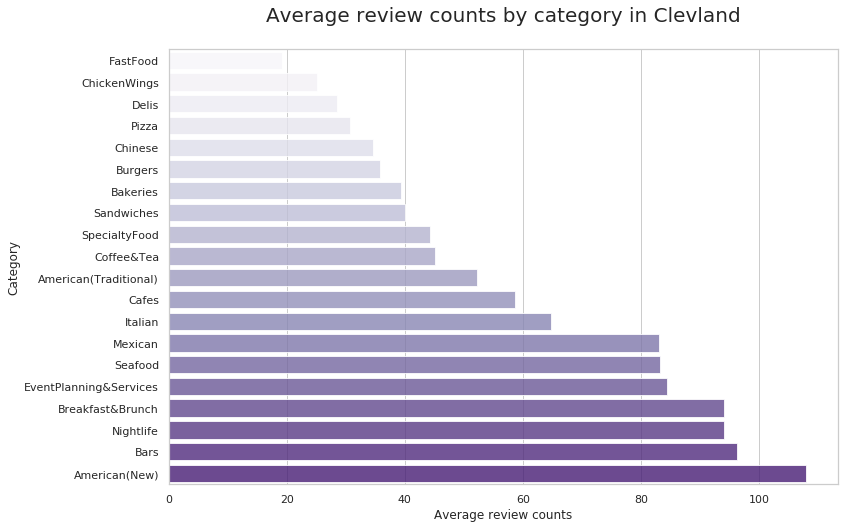

In [62]:
sorted_review_count = categoryDf.sort_values(by=['avg_review_count'])
    
plt.figure(figsize=(12,8))
ax = sns.barplot(sorted_review_count.avg_review_count, sorted_review_count.category, alpha=0.8, palette='Purples')
plt.title("Average review counts by category in Clevland\n", fontsize=20)
locs, labels = plt.xticks()
plt.ylabel('Category', fontsize=12)
plt.xlabel('Average review counts', fontsize=12) 

rects = ax.patches
labels = sorted_star.avg_star
for rect, label in zip(rects, labels):
    height = rect.get_height()

plt.show()

#### Average star of ratings and average review counts by category

In [63]:
sorted_category = categoryDf.sort_values(by=['category'])

sizeList = [x / 5 for x in sorted_category.avg_review_count.tolist()]
textList = ['Average review count: {:.0f}'.format(review_count) for star, review_count in zip(sorted_category.avg_star.tolist(), sorted_category.avg_review_count.tolist())]

trace = go.Scatter(   
    x=sorted_category.category.tolist(),
    y=[round(y, 2) for y in sorted_category.avg_star.tolist()],
    text=textList,
    mode='markers',
    marker=dict(
        size=sizeList,
        color='purple',
    )
)

layout = go.Layout(
    title='Average stars of rating and average review counts by category in Clevland',
    xaxis=dict(
        title='Business Categories',
        gridcolor='rgb(255, 255, 255)',
        zerolinewidth=1,
        ticklen=5,
        gridwidth=2,
    ),
    yaxis=dict(
        title='Average Star Rating',
        gridcolor='rgb(255, 255, 255)',
        zerolinewidth=1,
        ticklen=5,
        gridwidth=2,
    ),
    paper_bgcolor='rgb(243, 243, 243)',
    plot_bgcolor='rgb(243, 243, 243)',
)

fig = go.Figure(data = [trace], layout = layout)
py.offline.iplot(fig, filename='bubblechart-business')